# Project T-cell functional states with starCAT

**Biology rationale.** Continuous T-cell programs complement discrete annotations and reveal response-associated immune states.

**Aim.** Apply starCAT reference programs to T cells and visualize program usage across the cohort.

**Data input.** `sce1_tcell.h5ad`, `STAR_adata_obs.tsv`, `STAR_adata_var.tsv`



**Data outputs.** Processed objects, statistical summaries, and visualizations generated in the notebook.

## 1. Packages and setup


In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import os
import matplotlib.pyplot as plt
import sys
import seaborn as sns
from starcat import starCAT

In [2]:
# Initialize directory to download example data to
data_dir = './TCAT_results'

if not os.path.exists(data_dir):
    os.mkdir(data_dir)


In [3]:
import starcat
starcat.available_refs

array(['TCAT.V1', 'MYELOID.GLIOMA.V1', 'BONEMARROW.CD34POS.HSPC.V1'],
      dtype=object)

In [4]:
tcat = starCAT(reference='TCAT.V1', cachedir='./cache')

Using reference from starCAT database
Loading reference from existing cache file for reference TCAT.V1


In [5]:
# View first 5 GEPs and 5 genes for default reference spectra (genes x programs)
print(tcat.ref_name)
display(tcat.ref.iloc[:5, :5])

TCAT.V1


,A1BG,AARD,AARSD1,ABCA1,ABCB1
CellCycle-G2M,2.032614,22.965553,17.423538,3.478179,2.297279
Translation,35.445282,0.000000,9.245893,0.477994,0.000000
HLA,18.192997,14.632670,2.686475,3.937182,0.000000
ISG,0.436212,0.000000,18.078197,17.354506,0.000000
Mito,10.293049,0.000000,52.669895,14.615502,3.341488


## 2. Reference-program projection


In [6]:
# This is the information for the scores that will be calculated byt starCAT with the current reference
tcat.score_data

{'scores': {'continuous': [{'name': 'ASA',
    'normalization': 'normalized',
    'columns': ['TIMD4/TIM3', 'ICOS/CD38', 'CTLA4/CD38', 'OX40/EBI3']},
   {'name': 'Proliferation',
    'normalization': 'normalized',
    'columns': ['CellCycle-G2M', 'CellCycle-S', 'CellCycle-Late-S']}],
  'discrete': [{'name': 'ASA_binary',
    'normalization': 'normalized',
    'columns': ['TIMD4/TIM3', 'ICOS/CD38', 'CTLA4/CD38', 'OX40/EBI3'],
    'threshold': 0.0625},
   {'name': 'Proliferation_binary',
    'normalization': 'normalized',
    'columns': ['CellCycle-G2M', 'CellCycle-S', 'CellCycle-Late-S'],
    'threshold': 0.1},
   {'name': 'Multinomial_Label',
    'normalization': 'normalized',
    'file': 'multinomial_lineage_classifier.py',
    'function': 'compute_lineage'}]}}

Alternatively, load a reference (with or without an additional scores file) from path as shown:


```tcat = starCAT(reference='.cache/TCAT.V1/TCAT.V1.reference.tsv', score_path='.cache/TCAT.V1/TCAT.V1.scores.yaml')```

In [7]:
adata = sc.read_h5ad("sce1_tcell.h5ad")

In [8]:
# Run starCAT to compute the usages and scores for the provided data 
usage, scores = tcat.fit_transform(adata)

/home/miniconda3/envs/cassiopeia/lib/python3.8/site-packages/starcat/starcat.py:244: UserWarning: WARNING!: query input is not an integer count matrix as expected.
            Please provide an integer count matrix unless you are sure you know what you are doing.
  warnings.warn("""WARNING!: query input is not an integer count matrix as expected.


3412 out of 3412 genes in the reference overlap with the query


/home/miniconda3/envs/cassiopeia/lib/python3.8/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator LogisticRegression from version 1.0.2 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


## 3. Visualization and figure generation


In [9]:
usage.head()

,CellCycle-G2M,Translation,HLA,ISG,Mito,Doublet-RBC,gdT,CellCycle-S,Cytotoxic,Doublet-Platelet,...,Tfh-2,OX40/EBI3,CD172a/MERTK,IEG3,Doublet-Fibroblast,SOX4/TOX2,CD40LG/TXNIP,Tph,Exhaustion,Tfh-1
ALl14_AAACCCAGTTAAACCC-1,0.000299,0.381291,0.001786,0.002251,0.048510,0.006050,0.003482,0.000421,0.009209,0.009114,...,0.005970,0.001419,0.152912,0.024369,0.010857,0.002415,0.018060,0.000368,0.000110,0.002579
ALl14_AAACCCATCTGTAACG-1,0.000178,0.359056,0.004921,0.004697,0.043153,0.008617,0.011918,0.000257,0.014569,0.001961,...,0.003700,0.001197,0.098003,0.015260,0.008116,0.002556,0.013598,0.001126,0.001217,0.001035
ALl14_AAACGAAAGTGATAGT-1,0.000333,0.409638,0.026477,0.011110,0.045591,0.000755,0.010694,0.000182,0.033508,0.001597,...,0.001019,0.001035,0.104620,0.007193,0.005438,0.001316,0.007421,0.000402,0.000607,0.000671
ALl14_AAACGAAGTAGCTGAG-1,0.000147,0.493360,0.002839,0.002214,0.044666,0.004660,0.005203,0.000136,0.010435,0.001470,...,0.001985,0.002032,0.098017,0.004226,0.005402,0.002064,0.010312,0.000120,0.000062,0.000481
ALl14_AAACGAATCCACCTGT-1,0.000307,0.387423,0.003951,0.002570,0.043106,0.000785,0.012026,0.000358,0.013441,0.001555,...,0.001780,0.001399,0.079929,0.026542,0.005200,0.001517,0.007281,0.001005,0.001094,0.000876


In [10]:
scores.head()

,ASA,Proliferation,ASA_binary,Proliferation_binary,Multinomial_Label
ALl14_AAACCCAGTTAAACCC-1,0.009338,0.001217,False,False,CD4_CM
ALl14_AAACCCATCTGTAACG-1,0.019123,0.000626,False,False,CD4_CM
ALl14_AAACGAAAGTGATAGT-1,0.027931,0.001107,False,False,CD4_EM
ALl14_AAACGAAGTAGCTGAG-1,0.006804,0.000583,False,False,CD4_Naive
ALl14_AAACGAATCCACCTGT-1,0.009386,0.001088,False,False,MAIT


In [11]:
adata

AnnData object with n_obs × n_vars = 135109 × 36601
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ig', 'percent.hb', 'unintegrated_clusters', 'seurat_clusters', 'barcode', 'Nover', 'harmony_clusters'
    var: 'vf_vst_counts_mean', 'vf_vst_counts_variance', 'vf_vst_counts_variance.expected', 'vf_vst_counts_variance.standardized', 'vf_vst_counts_variable', 'vf_vst_counts_rank', 'var.features', 'var.features.rank'
    obsm: 'X_harmony', 'X_pca', 'X_umap'

In [12]:
# Merge usages and scores with cell metadata
adata.obs = pd.merge(left=adata.obs, right=usage, how='left', left_index=True, right_index=True)

# Modify object type to string for plotting in scanpy
scores[scores.columns[scores.columns.str.contains('_binary')]] = scores[scores.columns[scores.columns.str.contains('_binary')]].astype('str')
adata.obs = pd.merge(left=adata.obs, right=scores, how='left', left_index=True, right_index=True)

First we plot the discrete features output by starCAT

/home/miniconda3/envs/cassiopeia/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


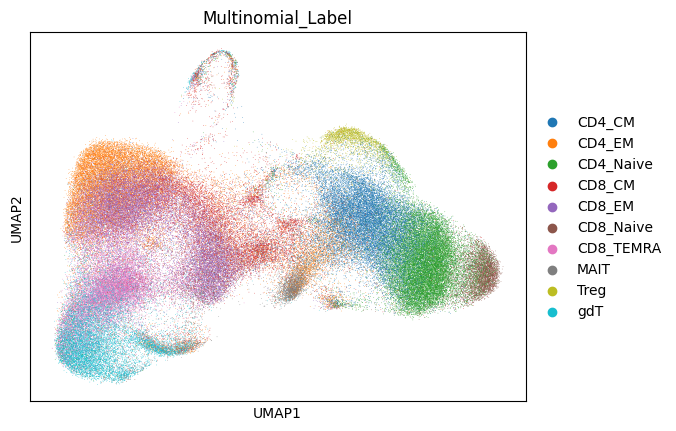

/home/miniconda3/envs/cassiopeia/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/miniconda3/envs/cassiopeia/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


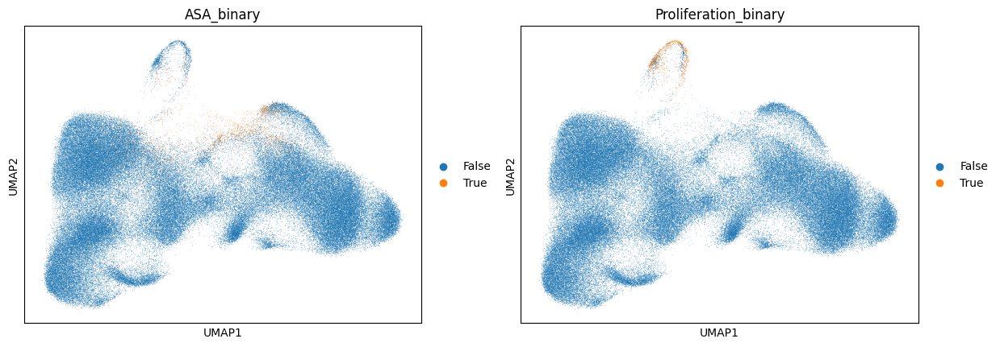

In [13]:
sc.pl.umap(adata, color='Multinomial_Label')
sc.pl.umap(adata, color=['ASA_binary', 'Proliferation_binary'])

As well as continuous scores

## 4. Save and export results


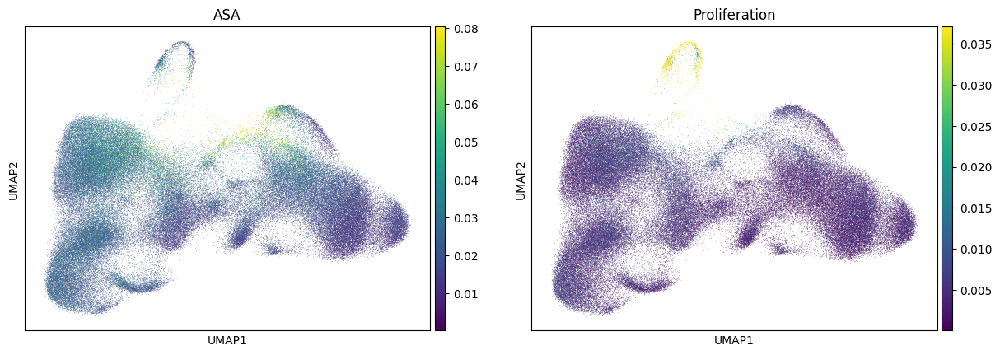

In [14]:
sc.pl.umap(adata, color=['ASA', 'Proliferation'], vmax='p99')

And we can output the continuous usages of all of the cGEPs

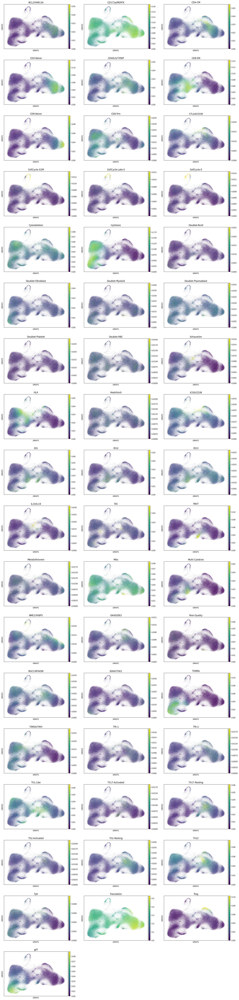

In [15]:
sc.pl.umap(adata, color=sorted(usage.columns), ncols=3, vmin=0, vmax='p99')

In [16]:
# Ensure categories become strings so R doesn't get confused
obs = adata.obs.copy()
for c in obs.select_dtypes(include="category").columns:
    obs[c] = obs[c].astype(str)
obs.index.name = "cell_id"

var = adata.var.copy()
for c in var.select_dtypes(include="category").columns:
    var[c] = var[c].astype(str)
var.index.name = "gene"

# Save core tables
obs.to_csv("STAR_adata_obs.tsv", sep="\t")          # cells × metadata
var.to_csv("STAR_adata_var.tsv", sep="\t")          # genes × metadata
